# 4 模型验证与优化

## 4.1 模型验证及选择

### 4.1.1 整体说明及准备工作

按照以下步骤对模型进行选择调优：
* 评价指标
* 验证方式
* 学习曲线
* 结果分析
* 模型选择
* 模型调参

In [1]:
from sklearn import metrics
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import preprocessing
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import LeavePOut
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import validation_curve
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

id_col_names = ['user_id', 'coupon_id', 'date_received']
target_col_name = 'label'
id_target_cols = ['user_id', 'coupon_id', 'date_received', 'label']
myeval = 'roc_auc'
datapath = 'data/'
featurepath = 'feature/'
resultpath = 'result/'
tmppath = 'tmp/'
scorepath = 'score/'

In [2]:
# 返回 ID 列
def get_id_df(df):
    return df[id_col_names]


# 返回 Target 列
def get_target_df(df):
    return df[target_col_name]


# 返回特征列
def get_predictors_df(df):
    predictors = [f for f in df.columns if f not in id_target_cols]
    return df[predictors]


# 按特征名读取训练集
def read_featurefile_train(featurename):
    df = pd.read_csv(featurepath + 'train_' + featurename + '.csv', sep=',', encoding='utf-8')
    df.fillna(0, inplace=True)
    return df


# 按特征名读取测试集
def read_featurefile_test(featurename):
    df = pd.read_csv(featurepath + 'test_' + featurename + '.csv', sep=',', encoding='utf-8')
    df.fillna(0, inplace=True)
    return df


# 将特征归一化
def standize_df(train_data, test_data):
    features_columns = [f for f in test_data.columns if f not in id_target_cols]
    min_max_scaler = preprocessing.MinMaxScaler()
    min_max_scaler = min_max_scaler.fit(train_data[features_columns])

    train_data_scaler = min_max_scaler.transform(train_data[features_columns])
    test_data_scaler = min_max_scaler.transform(test_data[features_columns])

    train_data_scaler = pd.DataFrame(train_data_scaler)
    train_data_scaler.columns = features_columns

    test_data_scaler = pd.DataFrame(test_data_scaler)
    test_data_scaler.columns = features_columns

    train_data_scaler['label'] = train_data['label']
    train_data_scaler[id_col_names] = train_data[id_col_names]
    test_data_scaler[id_col_names] = test_data[id_col_names]
    return train_data_scaler, test_data_scaler


# 按特征名读取数据
def read_data(featurename):
    traindf = read_featurefile_train(featurename)
    testdf = read_featurefile_test(featurename)
    return standize_df(traindf, testdf)

In [3]:
# 数据读取
train_f1, test_f1 = read_data('f1')
train_f2, test_f2 = read_data('sf2')
train_f3, test_f3 = read_data('sf3')

### 4.1.2 评价指标及预测方式

In [4]:
# 性能评价函数
#    目标是预测投放的优惠券是否核销
#    针对此任务及一些相关背景知识，使用优惠券核销预测的平均 AUC（ROC 曲线下面积）作为评价标准
#    即对每个优惠券 coupon_id 单独计算核销预测的 AUC 值，再对所有优惠券的 AUC 值求平均作为最终的评价标准
def myauc(test):
    testgroup = test.groupby(['coupon_id'])
    aucs = []
    for i in testgroup:
        coupon_df = i[1]
        if len(coupon_df['label'].unique()) < 2:
            continue
        auc = metrics.roc_auc_score(coupon_df['label'], coupon_df['pred'])
        aucs.append(auc)
    return np.average(aucs)

因为要的结果是购买的几率，所以不能直接用 Predict 因为这样会直接返回 0 或 1，而要用 predict_proba，它会返回每个类别的可能行，取其中为 1 的列即可。

### 4.1.3 验证方式

#### 4.1.3.1 简单交叉验证

In [5]:
# 简单交叉验证 f1
target = get_target_df(train_f1).copy()
traindf = train_f1.copy()

# 切分数据：训练数据 80%、验证数据 20%
train_all, test_all, train_target, test_target = train_test_split(traindf, target, test_size=0.2, random_state=0)

train_data = get_predictors_df(train_all).copy()
test_data = get_predictors_df(test_all).copy()

clf = LogisticRegression()
clf.fit(train_data, train_target)
train_pred = clf.predict_proba(train_data)[:, 1]
test_pred = clf.predict_proba(test_data)[:, 1]

score_train = roc_auc_score(train_target, train_pred)
score_test = roc_auc_score(test_target, test_pred)
print('LogisticRegression train 总体 AUC:', score_train)
print('LogisticRegression test 总体 AUC:', score_test)

train_all['pred'] = train_pred
test_all['pred'] = test_pred
print('LogisticRegression train Coupon AUC:', myauc(train_all))
print('LogisticRegression test Coupon AUC:', myauc(test_all))

LogisticRegression train 总体 AUC: 0.6633995155783169
LogisticRegression test 总体 AUC: 0.6674325376057579
LogisticRegression train Coupon AUC: 0.5402876536040013
LogisticRegression test Coupon AUC: 0.5410440709758992


In [6]:
# 简单交叉验证 f3
target = get_target_df(train_f3).copy()
traindf = train_f3.copy()

# 切分数据：训练数据 80%、验证数据 20%
train_all, test_all, train_target, test_target = train_test_split(traindf, target, test_size=0.2, random_state=0)

train_data = get_predictors_df(train_all).copy()
test_data = get_predictors_df(test_all).copy()

clf = LogisticRegression()
clf.fit(train_data, train_target)
train_pred = clf.predict_proba(train_data)[:, 1]
test_pred = clf.predict_proba(test_data)[:, 1]

score_train = roc_auc_score(train_target, train_pred)
score_test = roc_auc_score(test_target, test_pred)
print('LogisticRegression train 总体 AUC:', score_train)
print('LogisticRegression test 总体 AUC:', score_test)

train_all['pred'] = train_pred
test_all['pred'] = test_pred
print('LogisticRegression train Coupon AUC:', myauc(train_all))
print('LogisticRegression test Coupon AUC:', myauc(test_all))

LogisticRegression train 总体 AUC: 0.8440198068693635
LogisticRegression test 总体 AUC: 0.8449345453964185
LogisticRegression train Coupon AUC: 0.7222460505412859
LogisticRegression test Coupon AUC: 0.7458744419221256


#### 4.1.3.2 K 折交叉验证 K-fold CV

In [7]:
# 5 折交叉验证
train = train_f3.copy()
target = get_target_df(train_f3).copy()
kf = KFold(n_splits=5)

for k, (train_index, test_index) in enumerate(kf.split(train)):
    train_data, test_data, train_target, test_target = train.iloc[train_index], train.iloc[test_index], target[train_index], target[test_index]
    clf = LogisticRegression()
    clf.fit(get_predictors_df(train_data), train_target)
    train_pred = clf.predict_proba(get_predictors_df(train_data))[:, 1]
    test_pred = clf.predict_proba(get_predictors_df(test_data))[:, 1]
    score_train = roc_auc_score(train_target, train_pred)
    score_test = roc_auc_score(test_target, test_pred)
    train_data['pred'] = train_pred
    test_data['pred'] = test_pred
    print(k + 1, '折', 'LogisticRegression train 总体 AUC:', score_train)
    print(k + 1, '折', 'LogisticRegression test 总体 AUC:', score_test)
    print(k + 1, '折', 'LogisticRegression train Coupon AUC:', myauc(train_data))
    print(k + 1, '折', 'LogisticRegression test Coupon AUC:', myauc(test_data), '\n')

1 折 LogisticRegression train 总体 AUC: 0.8367710214910273
1 折 LogisticRegression test 总体 AUC: 0.8699391562023356
1 折 LogisticRegression train Coupon AUC: 0.7203739302207426
1 折 LogisticRegression test Coupon AUC: 0.7352896336468014 

2 折 LogisticRegression train 总体 AUC: 0.8375775005251882
2 折 LogisticRegression test 总体 AUC: 0.8686188241551152
2 折 LogisticRegression train Coupon AUC: 0.7235029328261323
2 折 LogisticRegression test Coupon AUC: 0.7264977225874638 

3 折 LogisticRegression train 总体 AUC: 0.8488820673727142
3 折 LogisticRegression test 总体 AUC: 0.8249687018781188
3 折 LogisticRegression train Coupon AUC: 0.7258781948675143
3 折 LogisticRegression test Coupon AUC: 0.7313874364692555 

4 折 LogisticRegression train 总体 AUC: 0.8496890166702963
4 折 LogisticRegression test 总体 AUC: 0.8219303593887228
4 折 LogisticRegression train Coupon AUC: 0.7172778739846384
4 折 LogisticRegression test Coupon AUC: 0.7490023757380279 

5 折 LogisticRegression train 总体 AUC: 0.8497813602740366
5 折 LogisticRegr

#### 4.1.3.3 留 P 法 LPO CV

In [8]:
train = train_f3.copy()
target = get_target_df(train_f3).copy()
lpo = LeavePOut(p=200)
num = 100

for k, (train_index, test_index) in enumerate(lpo.split(train)):
    train_data, test_data, train_target, test_target = train.iloc[train_index], train.iloc[test_index], target[train_index], target[test_index]
    clf = LogisticRegression()
    clf.fit(get_predictors_df(train_data), train_target)
    train_pred = clf.predict_proba(get_predictors_df(train_data))[:, 1]
    test_pred = clf.predict_proba(get_predictors_df(test_data))[:, 1]
    score_train = roc_auc_score(train_target, train_pred)
    score_test = roc_auc_score(test_target, test_pred)
    train_data['pred'] = train_pred
    test_data['pred'] = test_pred
    print(k + 1, '折', 'LogisticRegression train 总体 AUC:', score_train)
    print(k + 1, '折', 'LogisticRegression test 总体 AUC:', score_test)
    print(k + 1, '折', 'LogisticRegression train Coupon AUC:', myauc(train_data))
    print(k + 1, '折', 'LogisticRegression test Coupon AUC:', myauc(test_data), '\n')
    if k >= 5:
        break

1 折 LogisticRegression train 总体 AUC: 0.8443619882127695
1 折 LogisticRegression test 总体 AUC: 0.8938386524822696
1 折 LogisticRegression train Coupon AUC: 0.7208150359565737
1 折 LogisticRegression test Coupon AUC: 0.631578947368421 

2 折 LogisticRegression train 总体 AUC: 0.8443538796560078
2 折 LogisticRegression test 总体 AUC: 0.8933953900709221
2 折 LogisticRegression train Coupon AUC: 0.7206478528522081
2 折 LogisticRegression test Coupon AUC: 0.65 

3 折 LogisticRegression train 总体 AUC: 0.8443494468675008
3 折 LogisticRegression test 总体 AUC: 0.8938386524822696
3 折 LogisticRegression train Coupon AUC: 0.7207216622676023
3 折 LogisticRegression test Coupon AUC: 0.631578947368421 

4 折 LogisticRegression train 总体 AUC: 0.8445753887682305
4 折 LogisticRegression test 总体 AUC: 0.8947251773049645
4 折 LogisticRegression train Coupon AUC: 0.7208326174610814
4 折 LogisticRegression test Coupon AUC: 0.631578947368421 

5 折 LogisticRegression train 总体 AUC: 0.8441792287861298
5 折 LogisticRegression test 总体 AU

#### 4.1.3.4 StratifiedKFold

通过比较发现还是 StratifiedKFold 比较适合。因为正负样本分布不均匀，而 StratifiedKFold 分层采样交叉切分，确保训练集，测试集中各类别样本的比例与原始数据集中相同。

In [9]:
# 5 折交叉验证
train = train_f3.copy()
target = get_target_df(train_f3).copy()
kf = StratifiedKFold(n_splits=5)

for k, (train_index, test_index) in enumerate(kf.split(train, target)):
    train_data, test_data, train_target, test_target = train.iloc[train_index], train.iloc[test_index], target[train_index], target[test_index]
    clf = LogisticRegression()
    clf.fit(get_predictors_df(train_data), train_target)
    train_pred = clf.predict_proba(get_predictors_df(train_data))[:, 1]
    test_pred = clf.predict_proba(get_predictors_df(test_data))[:, 1]
    score_train = roc_auc_score(train_target, train_pred)
    score_test = roc_auc_score(test_target, test_pred)
    train_data['pred'] = train_pred
    test_data['pred'] = test_pred
    print(k + 1, '折', 'LogisticRegression train 总体 AUC:', score_train)
    print(k + 1, '折', 'LogisticRegression test 总体 AUC:', score_test)
    print(k + 1, '折', 'LogisticRegression train Coupon AUC:', myauc(train_data))
    print(k + 1, '折', 'LogisticRegression test Coupon AUC:', myauc(test_data), '\n')

1 折 LogisticRegression train 总体 AUC: 0.8367193829796297
1 折 LogisticRegression test 总体 AUC: 0.8682360658273972
1 折 LogisticRegression train Coupon AUC: 0.723277129896032
1 折 LogisticRegression test Coupon AUC: 0.7319674279554016 

2 折 LogisticRegression train 总体 AUC: 0.8379885966157072
2 折 LogisticRegression test 总体 AUC: 0.8719361241866301
2 折 LogisticRegression train Coupon AUC: 0.7194012974385092
2 折 LogisticRegression test Coupon AUC: 0.7338604304834586 

3 折 LogisticRegression train 总体 AUC: 0.8482597852596129
3 折 LogisticRegression test 总体 AUC: 0.8297516132310571
3 折 LogisticRegression train Coupon AUC: 0.7235609291743215
3 折 LogisticRegression test Coupon AUC: 0.7312357022288662 

4 折 LogisticRegression train 总体 AUC: 0.8501061156972552
4 折 LogisticRegression test 总体 AUC: 0.821217034047267
4 折 LogisticRegression train Coupon AUC: 0.7203642195662052
4 折 LogisticRegression test Coupon AUC: 0.746715504705868 

5 折 LogisticRegression train 总体 AUC: 0.8494332725260973
5 折 LogisticRegress

### 4.1.4 模型比较

#### 4.1.4.1 测评分数

In [10]:
def get_sklearn_model(model_name, param=None):
    # 朴素贝叶斯
    if model_name == 'NB':
        model = MultinomialNB(alpha=0.01)

    # 逻辑回归
    elif model_name == 'LR':
        model = LogisticRegression(penalty='l2')

    # KNN
    elif model_name == 'KNN':
        model = KNeighborsClassifier()

    # 随机森林
    elif model_name == 'RF':
        model = RandomForestClassifier()

    # 决策树
    elif model_name == 'DT':
        model = tree.DecisionTreeClassifier()

    # 向量机
    elif model_name == 'SVC':
        model = SVC(kernel='rbf')

    # GBDT
    elif model_name == 'GBDT':
        model = GradientBoostingClassifier()

    # XGBoost
    elif model_name == 'XGB':
        model = XGBClassifier()

    # LightGBM
    elif model_name == 'LGB':
        model = LGBMClassifier()
    else:
        print('wrong model name!')
        return
    if param is not None:
        model.set_params(**param)
    return model


# 对算法进行分析
def classifier_df_score(train_feat, classifier, cvnum, param=None):
    clf = get_sklearn_model(classifier, param)
    train = train_feat.copy()
    target = get_target_df(train_feat).copy()
    kf = StratifiedKFold(n_splits=cvnum)

    scores = []
    score_coupons = []
    for _, (train_index, test_index) in enumerate(kf.split(train, target)):
        train_data, test_data, train_target, test_target = train.iloc[train_index], train.iloc[test_index], target[
            train_index], target[test_index]
        clf.fit(get_predictors_df(train_data), train_target)
        test_pred = clf.predict_proba(get_predictors_df(test_data))[:, 1]
        score_test = roc_auc_score(test_target, test_pred)
        test_data['pred'] = test_pred
        score_coupon_test = myauc(test_data)
        scores.append(score_test)
        score_coupons.append(score_coupon_test)

    print(classifier + '总体AUC:', scores)
    print(classifier + 'Coupon AUC:', score_coupons)

In [11]:
# f1 特征
train = train_f1.copy()
train.head()

,discount_rate,distance,if_fd,full_value,reduction_value,label,user_id,coupon_id,date_received
0,0.812785,0.1,1.0,0.500000,0.20,0,1439408,11002,20160528
1,0.939117,0.0,1.0,0.066667,0.01,0,1439408,8591,20160613
2,0.939117,0.0,1.0,0.066667,0.01,0,1439408,8591,20160516
3,0.761035,0.0,1.0,0.100000,0.05,0,2029232,1532,20160530
4,0.939117,0.0,1.0,0.066667,0.01,0,2029232,12737,20160519


In [12]:
print('特征 f1, 不同模型 5 折训练 Score:')
classifier_df_score(train, 'NB', 5)
classifier_df_score(train, 'LR', 5)
classifier_df_score(train, 'RF', 5)
classifier_df_score(train, 'LGB', 5)

特征 f1, 不同模型 5 折训练 Score:
NB总体AUC: [np.float64(0.6484186809106656), np.float64(0.6538346697838108), np.float64(0.6573801264615924), np.float64(0.6503909739692905), np.float64(0.6633592555110361)]
NBCoupon AUC: [np.float64(0.5363631418076686), np.float64(0.5338265093921163), np.float64(0.5334927461290747), np.float64(0.5415356445668099), np.float64(0.5384562409294064)]
LR总体AUC: [np.float64(0.6630040296092025), np.float64(0.6609670550753014), np.float64(0.6640765248174756), np.float64(0.6624890611853228), np.float64(0.6708588230964967)]
LRCoupon AUC: [np.float64(0.5363631418076686), np.float64(0.5338265093921163), np.float64(0.5334927461290747), np.float64(0.5415356445668099), np.float64(0.5384562409294064)]
RF总体AUC: [np.float64(0.6842975716897524), np.float64(0.6841572287380121), np.float64(0.6844713039357535), np.float64(0.6820986498781112), np.float64(0.6867055815436558)]
RFCoupon AUC: [np.float64(0.5319536927490356), np.float64(0.5270062882245454), np.float64(0.5194119117220082), np.f

In [13]:
# f2 特征
train = train_f2.copy()
train.head()

,discount_rate,distance,if_fd,full_value,reduction_value,total_sales,sales_use_coupon,total_coupon,merchant_distance_min,merchant_distance_max,...,user_merchant_any,user_merchant_buy_common,user_merchant_coupon_transfer_rate,user_merchant_coupon_buy_rate,user_merchant_rate,user_merchant_common_buy_rate,label,user_id,coupon_id,date_received
0,0.863014,0.0,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0,1832624,7610,20160429
1,0.786910,1.0,1.0,0.666667,0.30,0.037988,0.043496,0.214299,0.0,1.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0,163606,5054,20160421
2,0.863014,0.2,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.012346,0.0,0.0,0.0,0.0,0.0,0,94107,7610,20160412
3,0.863014,1.0,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.012346,0.0,0.0,0.0,0.0,0.0,0,4061024,7610,20160426
4,0.761035,1.0,1.0,0.100000,0.05,0.302988,0.392295,0.209746,0.0,1.0,...,0.012346,0.0,0.0,0.0,0.0,0.0,0,4061024,9871,20160409


In [14]:
print('特征 f2, 不同模型 5 折训练 Score:')
classifier_df_score(train, 'NB', 5)
classifier_df_score(train, 'LR', 5)
classifier_df_score(train, 'RF', 5)
classifier_df_score(train, 'LGB', 5)

特征 f2, 不同模型 5 折训练 Score:
NB总体AUC: [np.float64(0.8220931929754454), np.float64(0.8041439476875973), np.float64(0.7473969057092373), np.float64(0.7364328011348492), np.float64(0.7399166479676679)]
NBCoupon AUC: [np.float64(0.6306880228045485), np.float64(0.6121314261743251), np.float64(0.6074369206205684), np.float64(0.6123035068071413), np.float64(0.6024926183731578)]
LR总体AUC: [np.float64(0.8375880797942806), np.float64(0.834109913762996), np.float64(0.7825550138959755), np.float64(0.7729297576284013), np.float64(0.775214964124862)]
LRCoupon AUC: [np.float64(0.6308614871526279), np.float64(0.6258487767615749), np.float64(0.6100470068096994), np.float64(0.6103328021057165), np.float64(0.6053906317397615)]
RF总体AUC: [np.float64(0.7948667502269461), np.float64(0.7882813647769299), np.float64(0.7693086204284636), np.float64(0.778341888519174), np.float64(0.7910819622247307)]
RFCoupon AUC: [np.float64(0.5866195196578706), np.float64(0.536636958132183), np.float64(0.5273012022080185), np.float

In [15]:
# f3 特征
train = train_f3.copy()
train.head()

,discount_rate,distance,if_fd,full_value,reduction_value,total_sales,sales_use_coupon,total_coupon,merchant_distance_min,merchant_distance_max,...,this_month_user_receive_same_coupon_lastone,this_month_user_receive_same_coupon_firstone,this_day_receive_all_coupon_count,this_day_user_receive_same_coupon_count,day_gap_before,day_gap_after,label,user_id,coupon_id,date_received
0,0.863014,0.0,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,1832624,7610,20160429
1,0.786910,1.0,1.0,0.666667,0.30,0.037988,0.043496,0.214299,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,163606,5054,20160421
2,0.863014,0.2,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,94107,7610,20160412
3,0.863014,1.0,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,4061024,7610,20160426
4,0.761035,1.0,1.0,0.100000,0.05,0.302988,0.392295,0.209746,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,4061024,9871,20160409


In [16]:
print('特征 f3, 不同模型 5 折训练 Score:')
classifier_df_score(train, 'NB', 5)
classifier_df_score(train, 'LR', 5)
classifier_df_score(train, 'RF', 5)
classifier_df_score(train, 'LGB', 5)

特征 f3, 不同模型 5 折训练 Score:
NB总体AUC: [np.float64(0.8600232871434285), np.float64(0.8454000250719758), np.float64(0.7975100267142217), np.float64(0.7866414257727325), np.float64(0.7892483984512402)]
NBCoupon AUC: [np.float64(0.7175196206132957), np.float64(0.7179948792774353), np.float64(0.7164928734195067), np.float64(0.7215488482224762), np.float64(0.7188771195885274)]
LR总体AUC: [np.float64(0.8682360658273972), np.float64(0.8719361241866301), np.float64(0.8297516132310571), np.float64(0.821217034047267), np.float64(0.8218056635536211)]
LRCoupon AUC: [np.float64(0.7319674279554016), np.float64(0.7338604304834586), np.float64(0.7312357022288662), np.float64(0.746715504705868), np.float64(0.7374308770968482)]
RF总体AUC: [np.float64(0.8560938067983833), np.float64(0.8583108801726935), np.float64(0.845542213402966), np.float64(0.846300218991326), np.float64(0.8488722427944422)]
RFCoupon AUC: [np.float64(0.7149835470886149), np.float64(0.6968116691393073), np.float64(0.7013025876979458), np.float

通过对比训练集上不同算法的运算结果可以发现，f1 特征集因为特征比较少，有严重的欠拟合，所以所有算法的分数都比较低。

f2 特征集通过滑窗增加统计特征，它的分数比 f1 有了飞跃性的提高，其实在现实的业务场景 f2+LR 已经是一个很常用的解决方案了。之所以在实际作业中更倾向逻辑回归而不是类似 LightGBM 的算法，是为了减少计算量。当然如果计算资源不是问题的话，LightGBM 也是一个好选择。

#### 4.1.4.2 绘制学习曲线进行可视化分析

In [17]:
# 绘制学习曲线
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=1, train_sizes=[0.01, 0.02, 0.05, 0.1, 0.2, 0.3]):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel('Training examples')
    plt.ylabel('Score')
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, scoring=myeval, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color='r')
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color='g')
    plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
    plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
    plt.legend(loc='best')
    plt.show()
    return plt


def plot_curve_single(traindf, classifier, cvnum, train_sizes=[0.01, 0.02, 0.05, 0.1, 0.2, 0.3]):
    X = get_predictors_df(traindf)
    y = get_target_df(traindf)
    title = 'learning curve of ' + classifier + ', cv:' + str(cvnum)
    estimator = get_sklearn_model(classifier)
    plot_learning_curve(estimator, title, X, y, ylim=(0, 1.01), cv=cvnum, train_sizes=train_sizes)

f1 特征集：

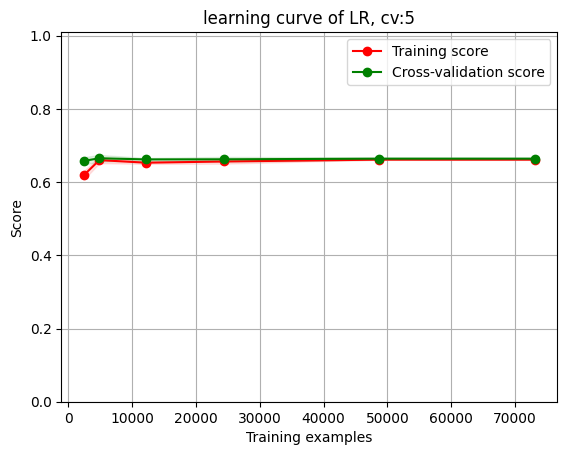

In [18]:
plot_curve_single(train_f1, 'LR', 5, [0.01, 0.02, 0.05, 0.1, 0.2, 0.3])

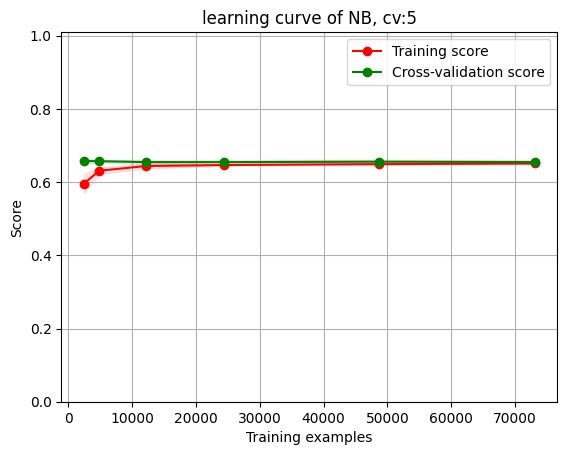

In [19]:
plot_curve_single(train_f1, 'NB', 5, [0.01, 0.02, 0.05, 0.1, 0.2, 0.3])

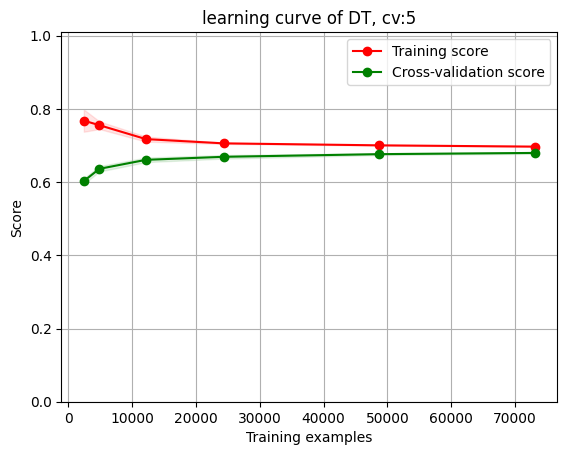

In [20]:
plot_curve_single(train_f1, 'DT', 5, [0.01, 0.02, 0.05, 0.1, 0.2, 0.3])

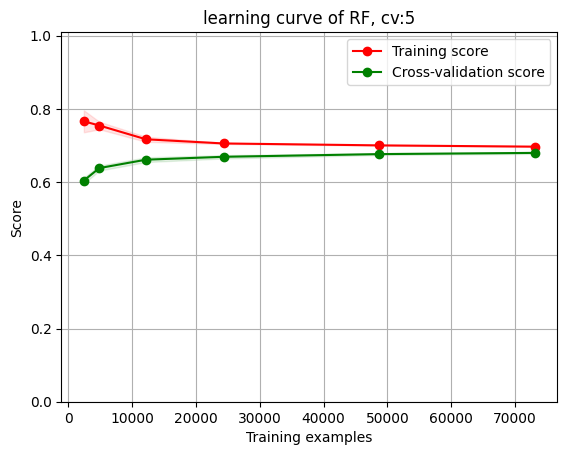

In [21]:
plot_curve_single(train_f1, 'RF', 5, [0.01, 0.02, 0.05, 0.1, 0.2, 0.3])

[LightGBM] [Info] Number of positive: 47, number of negative: 2389
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Number of data points in the train set: 2436, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.019294 -> initscore=-3.928483
[LightGBM] [Info] Start training from score -3.928483
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


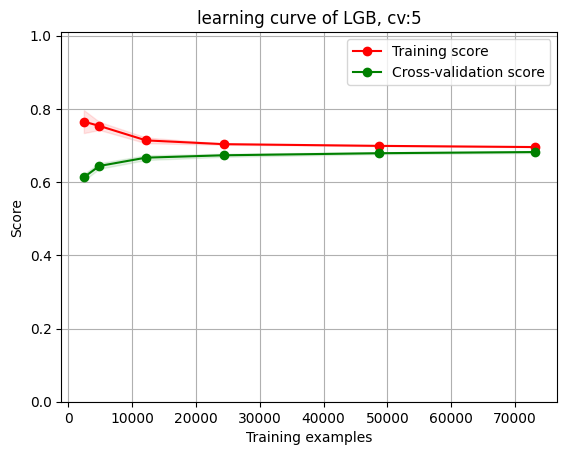

In [22]:
plot_curve_single(train_f1, 'LGB', 5, [0.01, 0.02, 0.05, 0.1, 0.2, 0.3])

f2 特征集：

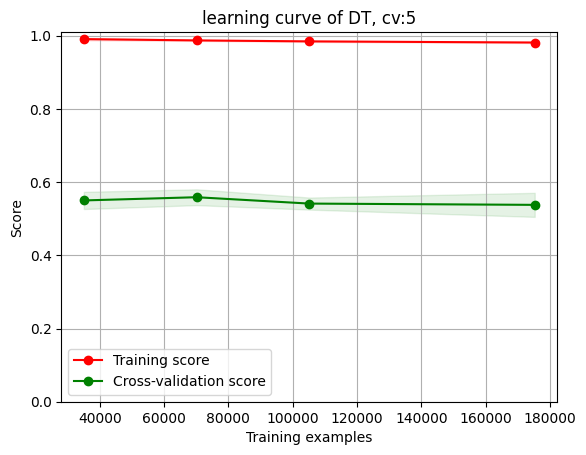

In [23]:
plot_curve_single(train_f2, 'DT', 5, [0.1, 0.2, 0.3, 0.5])

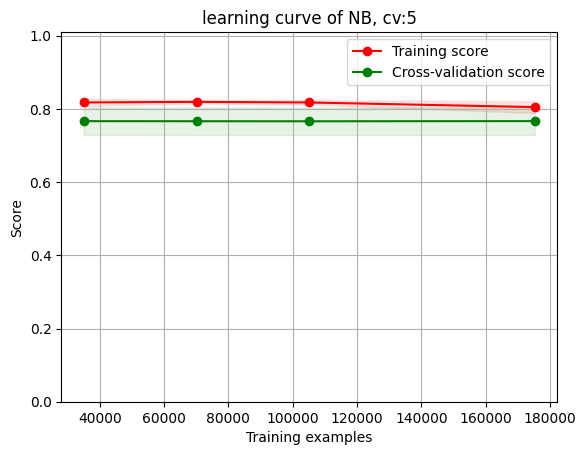

In [24]:
plot_curve_single(train_f2, 'NB', 5, [0.1, 0.2, 0.3, 0.5])

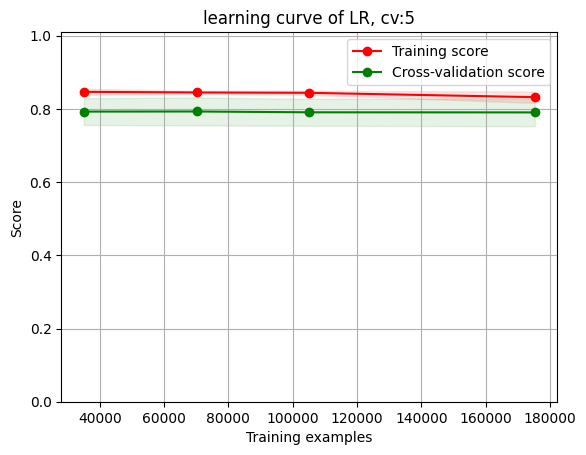

In [25]:
plot_curve_single(train_f2, 'LR', 5, [0.1, 0.2, 0.3, 0.5])

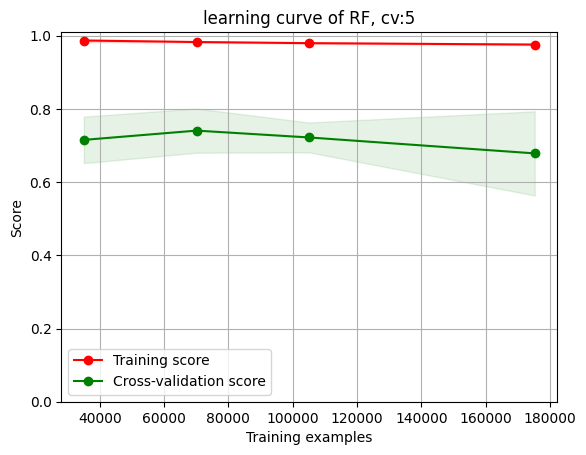

In [26]:
plot_curve_single(train_f2, 'RF', 5, [0.1, 0.2, 0.3, 0.5])

[LightGBM] [Info] Number of positive: 235, number of negative: 34818
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1760
[LightGBM] [Info] Number of data points in the train set: 35053, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.006704 -> initscore=-4.998304
[LightGBM] [Info] Start training from score -4.998304
[LightGBM] [Info] Number of positive: 2285, number of negative: 67821
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2009
[LightGBM] [Info] Number of data points in the train set: 70106, number of used features: 37
[LightGBM] [Info] [bi

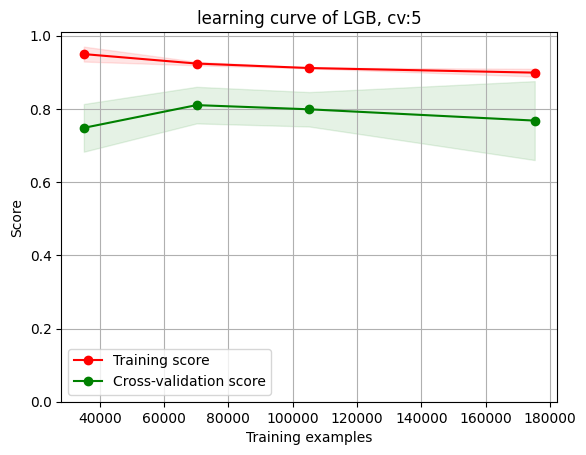

In [27]:
plot_curve_single(train_f2, 'LGB', 5, [0.1, 0.2, 0.3, 0.5])

f3 特征集：

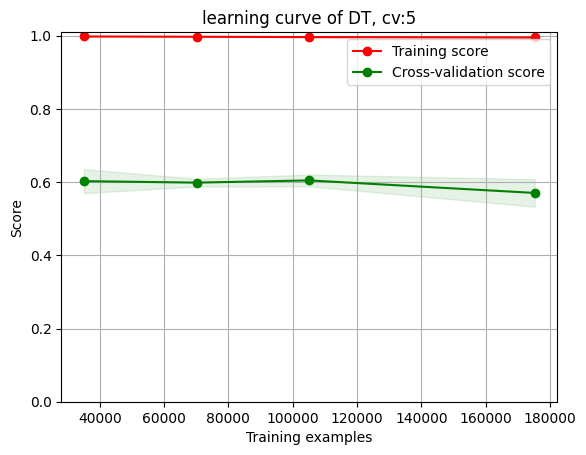

In [28]:
plot_curve_single(train_f3, 'DT', 5, [0.1, 0.2, 0.3, 0.5])

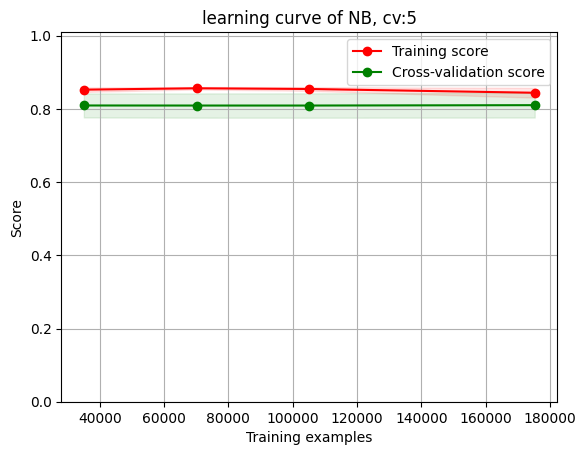

In [29]:
plot_curve_single(train_f3, 'NB', 5, [0.1, 0.2, 0.3, 0.5])

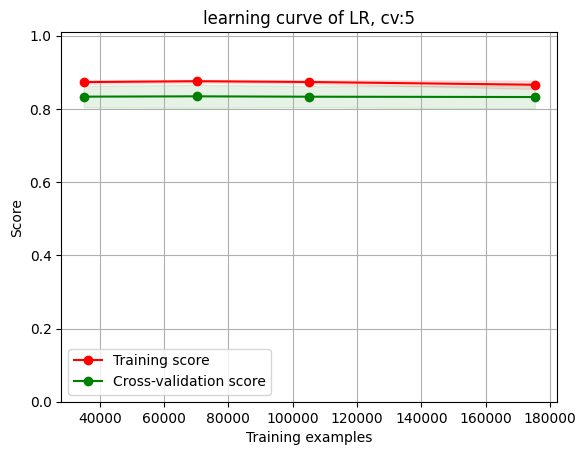

In [30]:
plot_curve_single(train_f3, 'LR', 5, [0.1, 0.2, 0.3, 0.5])

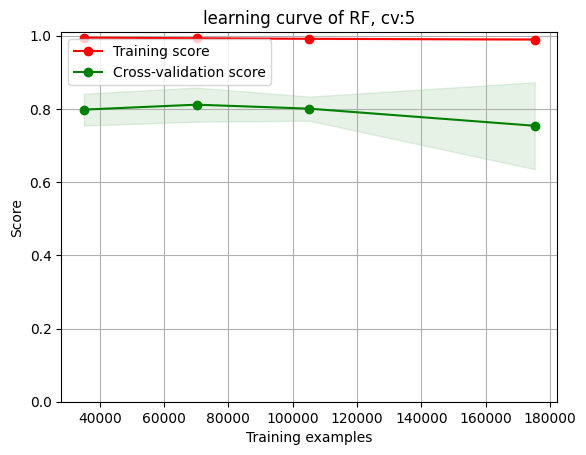

In [31]:
plot_curve_single(train_f3, 'RF', 5, [0.1, 0.2, 0.3, 0.5])

[LightGBM] [Info] Number of positive: 235, number of negative: 34818
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1880
[LightGBM] [Info] Number of data points in the train set: 35053, number of used features: 45
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.006704 -> initscore=-4.998304
[LightGBM] [Info] Start training from score -4.998304
[LightGBM] [Info] Number of positive: 2285, number of negative: 67821
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2141
[LightGBM] [Info] Number of data points in the train set: 70106, number of used features: 45
[LightGBM] [Info] [bi

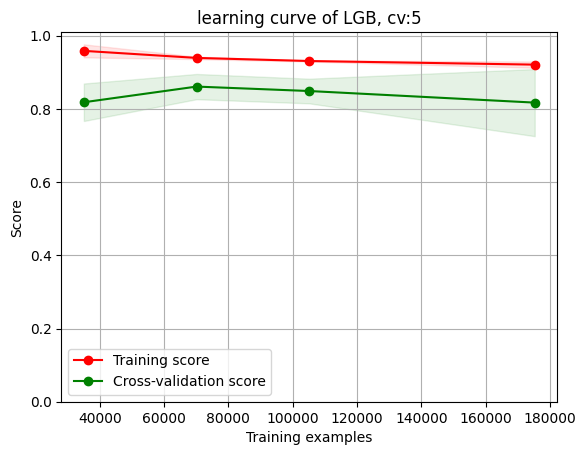

In [32]:
plot_curve_single(train_f3, 'LGB', 5, [0.1, 0.2, 0.3, 0.5])

可以发现在特征集 f1 上，评测分普遍比较低，是欠拟合。在特征集 f3 上决策树和随机森林都表现出过拟合。LGB 表现比较好。

## 4.2 模型超参空间及调参

In [33]:
# f3 特征
train = get_predictors_df(train_f3)
target = get_target_df(train_f3)
train.head()

,discount_rate,distance,if_fd,full_value,reduction_value,total_sales,sales_use_coupon,total_coupon,merchant_distance_min,merchant_distance_max,...,user_merchant_rate,user_merchant_common_buy_rate,this_month_user_receive_same_coupn_count,this_month_user_receive_all_coupon_count,this_month_user_receive_same_coupon_lastone,this_month_user_receive_same_coupon_firstone,this_day_receive_all_coupon_count,this_day_user_receive_same_coupon_count,day_gap_before,day_gap_after
0,0.863014,0.0,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,0.786910,1.0,1.0,0.666667,0.30,0.037988,0.043496,0.214299,0.0,1.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,0.863014,0.2,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,0.863014,1.0,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.0,0.0,0.0,0.017857,0.0,0.0,0.0,0.0,0.0,0.0
4,0.761035,1.0,1.0,0.100000,0.05,0.302988,0.392295,0.209746,0.0,1.0,...,0.0,0.0,0.0,0.017857,0.0,0.0,0.0,0.0,0.0,0.0


### 4.2.1 以随机森林为例介绍基本调用方法

#### 4.2.1.1 穷举网格搜索

In [34]:
# 切分数据：训练数据 80%、验证数据 20%
train_data, test_data, train_target, test_target = train_test_split(train, target, test_size=0.2, random_state=0)

model = RandomForestClassifier()
parameters = {
    'n_estimators': [20, 50, 100],
    'max_depth': [1, 2, 3]
}

clf = GridSearchCV(model, parameters, cv=3, verbose=2)
clf.fit(train_data, train_target)

score_test = roc_auc_score(test_target, clf.predict(test_data))

print('RandomForestClassifier GridSearchCV test AUC:', score_test)
print('最优参数:')
print(clf.best_params_)
sorted(clf.cv_results_.keys())

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] END .......................max_depth=1, n_estimators=20; total time=   0.6s
[CV] END .......................max_depth=1, n_estimators=20; total time=   0.5s
[CV] END .......................max_depth=1, n_estimators=20; total time=   0.5s
[CV] END .......................max_depth=1, n_estimators=50; total time=   1.4s
[CV] END .......................max_depth=1, n_estimators=50; total time=   1.4s
[CV] END .......................max_depth=1, n_estimators=50; total time=   1.4s
[CV] END ......................max_depth=1, n_estimators=100; total time=   2.9s
[CV] END ......................max_depth=1, n_estimators=100; total time=   3.0s
[CV] END ......................max_depth=1, n_estimators=100; total time=   3.0s
[CV] END .......................max_depth=2, n_estimators=20; total time=   0.8s
[CV] END .......................max_depth=2, n_estimators=20; total time=   0.8s
[CV] END .......................max_depth=2, n_es

['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'param_max_depth',
 'param_n_estimators',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split1_test_score',
 'split2_test_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score']

运行起来可以发现网格搜索很耗时间，每次训练及预测的次数是按照参数的个数指数增长的。所以一次不要搜索太多的参数，一般 1 至 2 个就可以了。

#### 4.2.1.2 随机参数优化

In [35]:
# 切分数据：训练数据 80%、验证数据 20%
train_data, test_data, train_target, test_target = train_test_split(train, target, test_size=0.2, random_state=0)

model = RandomForestClassifier()
parameters = {
    'n_estimators': [10, 20, 30, 50],
    'max_depth': [1, 2, 3]
}

clf = RandomizedSearchCV(model, parameters, cv=3, verbose=2)
clf.fit(train_data, train_target)

score_test = roc_auc_score(test_target, clf.predict(test_data))

print('RandomForestClassifier RandomizedSearchCV test AUC:', score_test)
print('最优参数:')
print(clf.best_params_)
sorted(clf.cv_results_.keys())

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END .......................max_depth=3, n_estimators=30; total time=   1.5s
[CV] END .......................max_depth=3, n_estimators=30; total time=   1.5s
[CV] END .......................max_depth=3, n_estimators=30; total time=   1.5s
[CV] END .......................max_depth=2, n_estimators=10; total time=   0.4s
[CV] END .......................max_depth=2, n_estimators=10; total time=   0.4s
[CV] END .......................max_depth=2, n_estimators=10; total time=   0.3s
[CV] END .......................max_depth=1, n_estimators=30; total time=   0.8s
[CV] END .......................max_depth=1, n_estimators=30; total time=   0.8s
[CV] END .......................max_depth=1, n_estimators=30; total time=   0.8s
[CV] END .......................max_depth=1, n_estimators=50; total time=   1.4s
[CV] END .......................max_depth=1, n_estimators=50; total time=   1.4s
[CV] END .......................max_depth=1, n_e

['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'param_max_depth',
 'param_n_estimators',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split1_test_score',
 'split2_test_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score']

### 4.2.2 f3 特征集和 LightGBM 网格调参

LightGBM 调参次序：
* 第一步：学习率和迭代次数
* 第二步：确定 max_depth 和 num_leaves
* 第三步：确定 min_data_in_leaf 和 max_bin in
* 第四步：确定 feature_fraction、bagging_fraction、bagging_freq
* 第五步：确定 lambda_l1 和 lambda_l2
* 第六步：确定 min_split_gain
* 第七步：降低学习率，增加迭代次数，验证模型

In [36]:
# f3 特征
traindf = train_f3.copy()

# 按日期分割，为了加快速度，只用了一般数据进行网格调参，正式的时候应该全用
train = traindf[traindf.date_received < 20160515]
test = traindf[traindf.date_received >= 20160515]

train_data = get_predictors_df(train).copy()
train_target = get_target_df(train).copy()
test_data = get_predictors_df(test).copy()
test_target = get_target_df(test).copy()

traindf.head()

,discount_rate,distance,if_fd,full_value,reduction_value,total_sales,sales_use_coupon,total_coupon,merchant_distance_min,merchant_distance_max,...,this_month_user_receive_same_coupon_lastone,this_month_user_receive_same_coupon_firstone,this_day_receive_all_coupon_count,this_day_user_receive_same_coupon_count,day_gap_before,day_gap_after,label,user_id,coupon_id,date_received
0,0.863014,0.0,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,1832624,7610,20160429
1,0.786910,1.0,1.0,0.666667,0.30,0.037988,0.043496,0.214299,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,163606,5054,20160421
2,0.863014,0.2,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,94107,7610,20160412
3,0.863014,1.0,1.0,0.666667,0.20,0.722209,0.898094,1.000000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,4061024,7610,20160426
4,0.761035,1.0,1.0,0.100000,0.05,0.302988,0.392295,0.209746,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,4061024,9871,20160409


In [37]:
# 第一步：学习率和迭代次数

# 切分数据：训练数据 80%、验证数据 20%
model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', learning_rate=0.1, max_depth=5, bagging_fraction=0.8, feature_fraction=0.8)
parameters = {'n_estimators': [100, 150, 175, 200, 225, 250]}

clf = GridSearchCV(model, parameters, cv=3, verbose=2)
clf.fit(train_data, train_target)

score_test = roc_auc_score(test_target, clf.predict_proba(test_data)[:, 1])

print('LightGBM GridSearchCV AUC Score:   ', score_test)
print('最优参数:')
print(clf.best_params_)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 6898, number of negative: 113795
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2418
[LightGBM] [Info] Number of data points in the train set: 120693, number of used features: 45
[LightGBM] [Info] [binary:BoostFr

In [38]:
# 第二步：确定 max_depth 和 num_leaves
model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', n_estimators=200, learning_rate=0.1, bagging_fraction=0.8, feature_fraction=0.8)
parameters = {'max_depth': range(4, 8, 1), 'num_leaves': range(10, 150, 10)}
clf = GridSearchCV(model, parameters, cv=3, verbose=2)
clf.fit(train_data, train_target)

score_test = roc_auc_score(test_target, clf.predict_proba(test_data)[:, 1])

print('LightGBM GridSearchCV AUC Score:   ', score_test)
print('最优参数:')
print(clf.best_params_)

Fitting 3 folds for each of 56 candidates, totalling 168 fits
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 6898, number of negative: 113795
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2418
[LightGBM] [Info] Number of data points in the train set: 120693, number of used features: 45
[LightGBM] [Info] [binary:Boost

根据结果取 max_depth=6，num_leaves=40。

In [39]:
# 第三步：确定 min_data_in_leaf 和 max_bin in
model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', n_estimators=200, max_depth=6, num_leaves=40, learning_rate=0.1, bagging_fraction=0.8, feature_fraction=0.8)

parameters = {'max_bin': range(100, 500, 50), 'min_data_in_leaf': range(100, 150, 10)}
clf = GridSearchCV(model, parameters, cv=3, verbose=3)
clf.fit(train_data, train_target)

score_test = roc_auc_score(test_target, clf.predict_proba(test_data)[:, 1])

print('LightGBM GridSearchCV AUC Score:   ', score_test)
print('最优参数:')
print(clf.best_params_)

Fitting 3 folds for each of 40 candidates, totalling 120 fits
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 6898, number of negative: 113795
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006791 seconds.
You can set `force_row_wise=true`

In [40]:
# 第四步：确定 feature_fraction、bagging_fraction、bagging_freq 
model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', n_estimators=200, max_depth=6, num_leaves=40, max_bin=400, min_data_in_leaf=120, learning_rate=0.1, bagging_fraction=0.8, feature_fraction=0.8)

parameters = {'feature_fraction': [0.6, 0.7, 0.8, 0.9, 1.0], 'bagging_fraction': [0.6, 0.7, 0.8, 0.9, 1.0], 'bagging_freq': range(0, 10, 2)}

clf = GridSearchCV(model, parameters, cv=3, verbose=3)
clf.fit(train_data, train_target)

score_test = roc_auc_score(test_target, clf.predict_proba(test_data)[:, 1])

print('LightGBM GridSearchCV AUC Score:   ', score_test)
print('最优参数:')
print(clf.best_params_)

Fitting 3 folds for each of 125 candidates, totalling 375 fits
[LightGBM] [Warning] min_data_in_leaf is set=120, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=120
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] min_data_in_leaf is set=120, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=120
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: baggin

In [41]:
# 第五步：确定 lambda_l1 和 lambda_l2
model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', n_estimators=200, max_depth=6, num_leaves=40, max_bin=400, min_data_in_leaf=120, learning_rate=0.1, bagging_freq=4, bagging_fraction=0.9, feature_fraction=0.6)

parameters = {'lambda_l1': [1e-5, 1e-3, 1e-1, 0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0], 'lambda_l2': [1e-5, 1e-3, 1e-1, 0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0]}

clf = GridSearchCV(model, parameters, cv=3, verbose=3)
clf.fit(train_data, train_target)

score_test = roc_auc_score(test_target, clf.predict_proba(test_data)[:, 1])

print('LightGBM GridSearchCV AUC Score:   ', score_test)
print('最优参数:')
print(clf.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[LightGBM] [Warning] min_data_in_leaf is set=120, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=120
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1e-05
[LightGBM] [Warning] lambda_l2 is set=1e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] min_data_in_leaf is set=120, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=120
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[

In [42]:
# 第六步：确定 min_split_gain
model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', n_estimators=200, max_depth=6, num_leaves=40, max_bin=400, min_data_in_leaf=120, learning_rate=0.1, lambda_l1=1e-05, lambda_l2=1e-05, bagging_freq=4, bagging_fraction=0.9, feature_fraction=0.6)

parameters = {'min_split_gain': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}

clf = GridSearchCV(model, parameters, cv=3, verbose=3)
clf.fit(train_data, train_target)

score_test = roc_auc_score(test_target, clf.predict_proba(test_data)[:, 1])

print('LightGBM GridSearchCV AUC Score:   ', score_test)
print('最优参数:')
print(clf.best_params_)

Fitting 3 folds for each of 11 candidates, totalling 33 fits
[LightGBM] [Warning] min_data_in_leaf is set=120, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=120
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1e-05
[LightGBM] [Warning] lambda_l2 is set=1e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] min_data_in_leaf is set=120, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=120
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[Li

In [43]:
# 第七步：降低学习率，增加迭代次数，验证模型
model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', n_estimators=200, max_depth=6, num_leaves=40, max_bin=400, min_data_in_leaf=120, learning_rate=0.1, lambda_l1=1e-05, lambda_l2=1e-05, min_split_gain=0.0, bagging_freq=4, bagging_fraction=0.9, feature_fraction=0.6)

model.fit(train_data, train_target)
score_test = roc_auc_score(test_target, model.predict_proba(test_data)[:, 1])

print('LightGBM learning rate 0.1 AUC Score:   ', score_test)

model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', n_estimators=200, max_depth=6, num_leaves=40, max_bin=400, min_data_in_leaf=120, learning_rate=0.05, lambda_l1=1e-05, lambda_l2=1e-05, min_split_gain=0.0, bagging_freq=4, bagging_fraction=0.9, feature_fraction=0.6)

model.fit(train_data, train_target)
score_test = roc_auc_score(test_target, model.predict_proba(test_data)[:, 1])

print('LightGBM learning rate 0.05 AUC Score:   ', score_test)

model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', n_estimators=200, max_depth=6, num_leaves=40, max_bin=400, min_data_in_leaf=120, learning_rate=0.01, lambda_l1=1e-05, lambda_l2=1e-05, min_split_gain=0.0, bagging_freq=4, bagging_fraction=0.9, feature_fraction=0.6)

model.fit(train_data, train_target)
score_test = roc_auc_score(test_target, model.predict_proba(test_data)[:, 1])

print('LightGBM learning rate 0.01 AUC Score:   ', score_test)

model = LGBMClassifier(boosting_type='gbdt', objective='binary', metrics='auc', n_estimators=200, max_depth=6, num_leaves=40, max_bin=400, min_data_in_leaf=120, learning_rate=0.005, lambda_l1=1e-05, lambda_l2=1e-05, min_split_gain=0.0, bagging_freq=4, bagging_fraction=0.9, feature_fraction=0.6)

model.fit(train_data, train_target)
score_test = roc_auc_score(test_target, model.predict_proba(test_data)[:, 1])

print('LightGBM learning rate 0.005 AUC Score:   ', score_test)

[LightGBM] [Warning] min_data_in_leaf is set=120, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=120
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1e-05
[LightGBM] [Warning] lambda_l2 is set=1e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] min_data_in_leaf is set=120, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=120
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will 

In [44]:
model = LGBMClassifier()

model.fit(train_data, train_target)
score_test = roc_auc_score(test_target, model.predict_proba(test_data)[:, 1])

print('默认参数 AUC Score:   ', score_test)

[LightGBM] [Info] Number of positive: 10347, number of negative: 170693
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2615
[LightGBM] [Info] Number of data points in the train set: 181040, number of used features: 45
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.057153 -> initscore=-2.803170
[LightGBM] [Info] Start training from score -2.803170
默认参数 AUC Score:    0.8284887876924993


最优参数：

```python
model = LGBMClassifier(boosting_type='gbdt',
                       objective='binary',
                       metrics='auc',
                       n_estimators=200,
                       max_depth=6,
                       num_leaves=40,
                       max_bin=400,
                       min_data_in_leaf=120,
                       learning_rate=0.05,
                       lambda_l1=1e-05,
                       lambda_l2=1e-05,
                       min_split_gain=0.0,
                       bagging_freq=4,
                       bagging_fraction=0.9,
                       feature_fraction = 0.6)
```

In [45]:
# f3 特征
train = train_f3.copy()
train.head()
print('默认参数')
classifier_df_score(train, 'LGB', 5)
params = {'boosting_type': 'gbdt',
          'objective': 'binary',
          'eval_metric': 'auc',
          'n_estimators': 200,
          'max_depth': 5,
          'num_leaves': 40,
          'max_bin': 400,
          'min_data_in_leaf': 120,
          'learning_rate': 0.1,
          'lambda_l1': 1e-05,
          'lambda_l2': 1e-05,
          'min_split_gain': 0.0,
          'bagging_freq': 4,
          'bagging_fraction': 0.9,
          'feature_fraction': 0.6,
          'seed': 1024,
          'n_thread': 12}
print('调参后')
classifier_df_score(train, 'LGB', 5, params)

默认参数
[LightGBM] [Info] Number of positive: 26781, number of negative: 323751
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3057
[LightGBM] [Info] Number of data points in the train set: 350532, number of used features: 45
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.076401 -> initscore=-2.492282
[LightGBM] [Info] Start training from score -2.492282
[LightGBM] [Info] Number of positive: 26782, number of negative: 323751
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3087
[LightGBM] [Info] Number of data points in the train set: 350533, number of used features: 45
[LightGBM

对比发现调参后的结果比默认参数有所提高，不过不是高很多，比不上特征对结果的影响。而且因为调参只能再测试集上作，有的时候调参造成过拟，调参后线上成绩可能反而会下降。所以调参一般都是在后期再做，前期主要是特征和模型的选择。

### 4.2.3 绘制验证曲线

通过绘制验证曲线可视化调参过程。

In [46]:
# 对进行网格调参
def grid_plot(train_feat, classifier, cvnum, param_range, param_name, param=None):
    train_scores, test_scores = validation_curve(get_sklearn_model(classifier, param), get_predictors_df(train_feat), get_target_df(train_feat), param_name=param_name, param_range=param_range, cv=cvnum, scoring='roc_auc', n_jobs=1)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.title('Validation Curve with ' + param_name)
    plt.xlabel(param_name)
    plt.ylabel('Score')
    plt.ylim(0.0, 1.1)
    plt.semilogx(param_range, train_scores_mean, label='Training score', color='r')
    plt.fill_between(param_range, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color='r')
    plt.semilogx(param_range, test_scores_mean, label='Cross-validation score', color='g')
    plt.fill_between(param_range, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.2, color='g')
    plt.legend(loc='best')
    plt.show()

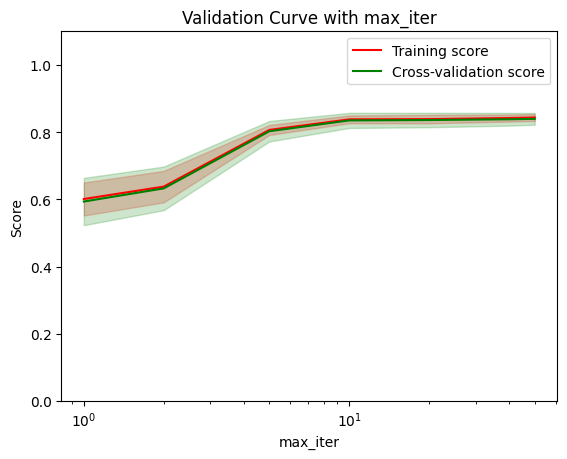

In [47]:
# 对逻辑回归的 max_iter 情况进行查看
train_feat = train_f3.copy()
grid_plot(train_feat, 'LR', 3, [1, 2, 5, 10, 20, 40, 50], 'max_iter', param=None)

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.6. Current value: feature_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.8, sub_feature=0.6 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.6. Current value: feature_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.8, sub_feature=0.6 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 22318, number of negative: 269792
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013498 seconds.
You can set `force_row_wise=true` to remove the overhead.


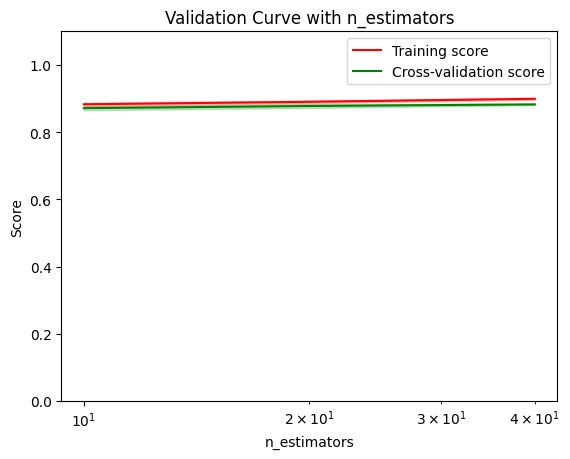

In [48]:
params = {
    'learning_rate': 0.1,
    'boosting_type': 'gbdt',
    'objective': 'binary',
    'metric': 'auc',
    'sub_feature': 0.6,
    'num_leaves': 50,
    'bagging_fraction': 0.8,
    'feature_fraction': 0.8
}
train_feat = train_f3.copy()
grid_plot(train_feat, 'LGB', 3, [10, 20, 40], 'n_estimators', param=params)

[LightGBM] [Info] Number of positive: 22318, number of negative: 269792
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3009
[LightGBM] [Info] Number of data points in the train set: 292110, number of used features: 45
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.076403 -> initscore=-2.492258
[LightGBM] [Info] Start training from score -2.492258
[LightGBM] [Info] Number of positive: 22318, number of negative: 269792
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3009
[LightGBM] [Info] Number of data points in the train set: 292110, number of used features: 45
[LightGBM] [In

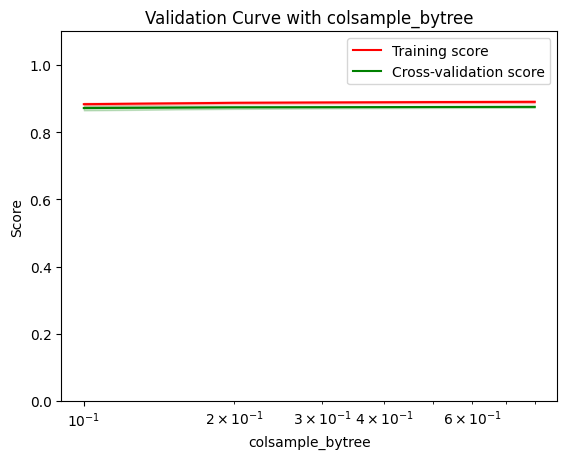

In [49]:
params = {
    'learning_rate': 0.1,
    'boosting_type': 'gbdt',
    'objective': 'binary',
    'metric': 'auc',
    'num_leaves': 10
}
train_feat = train_f3.copy()
grid_plot(train_feat, 'LGB', 3, [0.1, 0.2, 0.5, 0.7, 0.8], 'colsample_bytree', param=params)